# Emu3 Models Comparison: Fine Tuned vs Hugging Face with and without Classifier Free Guidance

In [1]:
from pathlib import Path
import matplotlib.pyplot as plt
from PIL import Image
import os
import pandas as pd
import numpy as np
from scipy.optimize import curve_fit
from rich import print

image_size = 512
guidance_scale = 5

## **A (not so) Short Note on Classifier-Free Guidance**

**Classifier-Free Guidance (CFG)** is a technique for **controlling generative models at inference time** by **modulating between conditional and unconditional outputs**. It was first used in Diffusion Models and then extended to Transformers. Its goal is to steer generation more strongly toward desired conditions (e.g., text prompts, labels) **without requiring an external classifier** (hence "classifier-free"). Instead, **the model is trained jointly on both conditional and unconditional data**, and during inference, **the outputs of the two settings are combined** in a way that amplifies guidance.

The method requires **two forward passes**:
1. One **unconditional** forward pass (no condition).
2. One **conditional** forward pass (with condition, e.g., text or label).

These two outputs are then combined via a guidance formula controlled by a **guidance scale** (often denoted by $s$, $w$, or $guidance_weight$), which interpolates or extrapolates between them.

The core insight is:
> If $f(x | c)$ is the conditional prediction and $f(x)$ the unconditional one, then:
>
> $$
f_{\text{guided}}(x | c) = f(x) + w \cdot (f(x | c) - f(x))
$$

This "pulls" the model's prediction more strongly toward the condition $c$, depending on the scale $w$.

---

### **Diffusion Models**

#### **Background**

Diffusion models are generative models that learn to reverse a **noising process** by gradually **denoising** an input $x_t$ (a noisy version of the target data at time $t$) to produce a clean sample $x_0$. The model is trained to predict either:
- The noise $\epsilon$ added at each step ($\epsilon_\theta(x_t, t, c)$)
- Or the clean image directly, depending on the parameterization.

#### **Conditional vs Unconditional Training**

- **Conditional training**: The model is trained to predict the noise given both the noised input $x_t$, the timestep $t$, and the **conditioning input** $c$ (e.g., class label or text).
- **Unconditional training**: The model is trained with **no conditioning input**, i.e., just $x_t$ and $t$.

In **Classifier-Free Guidance**, the model is trained **with both modes**: sometimes conditioning is dropped during training so that the model learns both behaviors.

#### **Inference and the CFG Formula**

At each denoising step in inference:

- **Two forward passes are made**:
  1. $\epsilon_{\theta}(x_t, t)$: the **unconditional prediction**
  2. $\epsilon_{\theta}(x_t, t, c)$: the **conditional prediction**

The guided prediction is computed as (<span style="color: red;">**preferred for transformers**</span>):

$$
\epsilon_{\text{guided}}(x_t, t, c) = \epsilon_{\theta}(x_t, t) + w \cdot (\epsilon_{\theta}(x_t, t, c) - \epsilon_{\theta}(x_t, t))
$$

This can also be written as (<span style="color: red;">**preferred for diffusion models**</span>):

$$
\epsilon_{\text{guided}}(x_t, t, c) = (1 + w) \cdot \epsilon_{\theta}(x_t, t, c) - w \cdot \epsilon_{\theta}(x_t, t)
$$

#### **Effect of Guidance Scale $w$**

- $w = 0$: No guidance, purely unconditional.
- $w = 1$: Linear interpolation.
- $w > 1$: Extrapolation — more strongly guided toward the condition (but too high can cause oversaturation or artifacts).

#### **Summary for Diffusion Models**

- **Requires two forward passes** per step.
- **Trains one model** that supports both conditional and unconditional generation.
- At inference: use a **guided combination** of the two predictions.
- Mathematical operation: **affine combination** of conditional and unconditional predictions.

---

### **Transformers**

#### **Context and Usage**

In Transformers (especially in **autoregressive models** like GPT, or **multimodal transformers** like those used in diffusion pipelines), CFG can be applied when the model is trained on both **text-conditioned** and **unconditioned** tokens, such as in **text-to-image generation** (e.g., Stable Diffusion's text encoder or multimodal transformer backends).

#### **How CFG is Applied in Transformers**

It depends on the model architecture and for the **Emu3** model the condition $c$ is the prompt we use to generate the image and the unconditional prompt can be another prompt specifying what we don't want in the image. By default the `transformers` library uses the last token of the prompt as the condition if no condition is specified when using CFG.

Let’s denote:
- $ \mathbf{c}_{\text{pos}} $: the prompt we use to generate the image
- $ \mathbf{c}_{\text{neg}} $: the unconditional prompt
- $ f(\mathbf{c}_{\text{pos}}) $: model logits/scores predictiona with conditioning
- $ f(\mathbf{c}_{\text{neg}}) $: model scores without conditioning

Again, the same guidance mechanism applies:

$$
f_{\text{CFG}}(\mathbf{c}_{\text{pos}}, \mathbf{c}_{\text{neg}}) = f(\mathbf{c}_{\text{neg}}) + w \cdot (f(\mathbf{c}_{\text{pos}}) - f(\mathbf{c}_{\text{neg}}))
$$

- This requires two forward passes**: one with a null condition, one with the actual condition.
- The outputs (e.g., noise prediction or logits) are then **combined linearly** using the guidance scale.

### **Mathematical Generalization**

Let:
- $ f_u = f(x) $: Unconditional prediction
- $ f_c = f(x|c) $: Conditional prediction
- $ w $: Guidance scale

Then:

$$
f_{\text{CFG}}(x, c) = f_u + w \cdot (f_c - f_u) = (1 + w)f_c - w f_u
$$

### Prompts Used for Image Generation with Emu3

I just copied the ones from the [GitHub example](https://github.com/baaivision/Emu3/blob/main/image_generation.py) of the Emu3 authors.

The conditional scores are generated with: `original_caption + POSITIVE_PROMPT_SUFFIX`

The unconditional scores are generated just with the `NEGATIVE_PROMPT_SUFFIX`


```python

POSITIVE_PROMPT_SUFFIX = "masterpiece, film grained, best quality."
NEGATIVE_PROMPT_SUFFIX = "lowres, bad anatomy, bad hands, text, error, \
    missing fingers, extra digit, fewer digits, cropped, worst quality, \
    low quality, normal quality, jpeg artifacts, signature, watermark, username, \
    blurry."
```

## Generated Images

In [5]:
def plot_images_from_directory(directory_path, prefix="512"):
    """
    Load and plot all images from a directory that start with a specific prefix.

    Args:
        directory_path: Path to the directory containing images
        prefix: String prefix to filter files (default: "0")
    """
    # Convert to Path object if string is provided
    directory = Path(directory_path)

    # Check if directory exists
    if not directory.exists() or not directory.is_dir():
        print(f"Directory {directory} does not exist or is not a directory")
        return

    # Get all files that start with the prefix
    image_files = sorted(
        [
            f
            for f in directory.glob(f"{prefix}*")
            if f.suffix.lower() in [".png", ".jpg", ".jpeg"]
        ]
    )

    if not image_files:
        print(f"No images starting with '{prefix}' found in {directory}")
        return

    print(f"Found {len(image_files)} images starting with '{prefix}'")

    # Plot each image one by one
    for idx, img_path in enumerate(image_files):
        try:
            # Open image using PIL
            img = Image.open(img_path)

            # Create a new figure for each image
            plt.figure(figsize=(12, 10))

            # Show image
            plt.imshow(img)
            plt.axis("off")
            plt.title(f"Image {idx + 1}: {img_path.name}")

            # Display the image
            plt.tight_layout()
            plt.show()

            print(f"Displayed {img_path.name} ({idx + 1}/{len(image_files)})")

        except Exception as e:
            print(f"Error displaying {img_path.name}: {e}")

Found 25 images starting with 'quintuplet_512_cfg5.0'

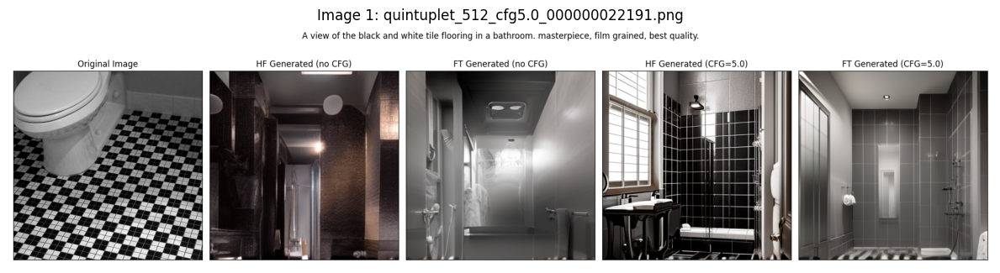

Displayed quintuplet_512_cfg5.0_000000022191.png (1/25)

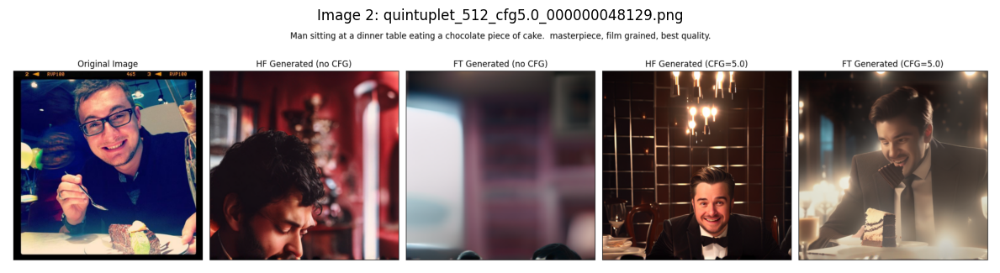

Displayed quintuplet_512_cfg5.0_000000048129.png (2/25)

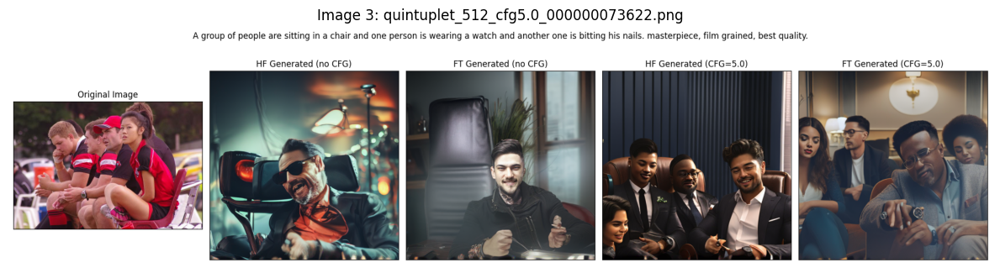

Displayed quintuplet_512_cfg5.0_000000073622.png (3/25)

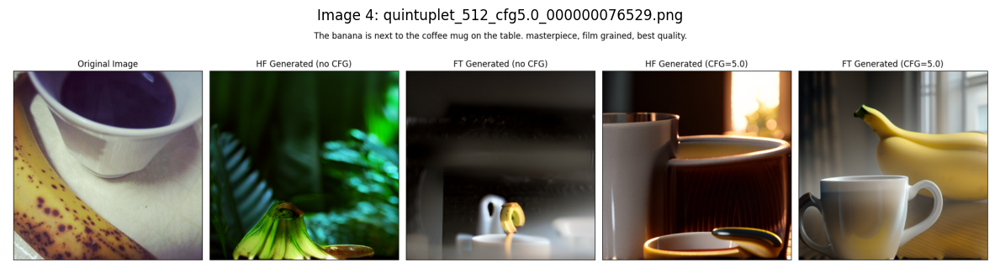

Displayed quintuplet_512_cfg5.0_000000076529.png (4/25)

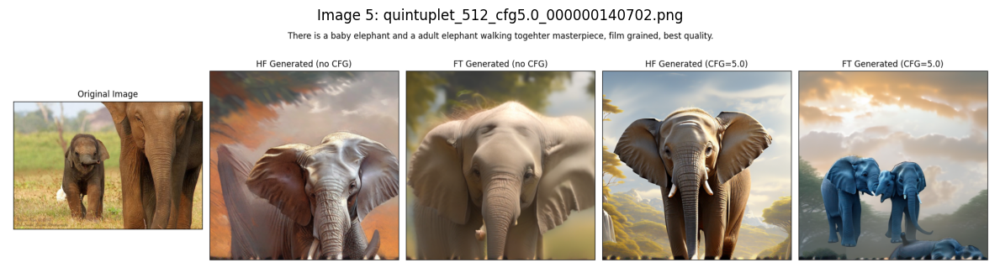

Displayed quintuplet_512_cfg5.0_000000140702.png (5/25)

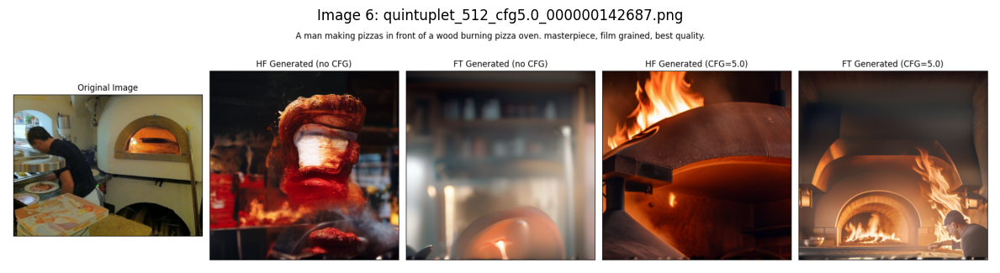

Displayed quintuplet_512_cfg5.0_000000142687.png (6/25)

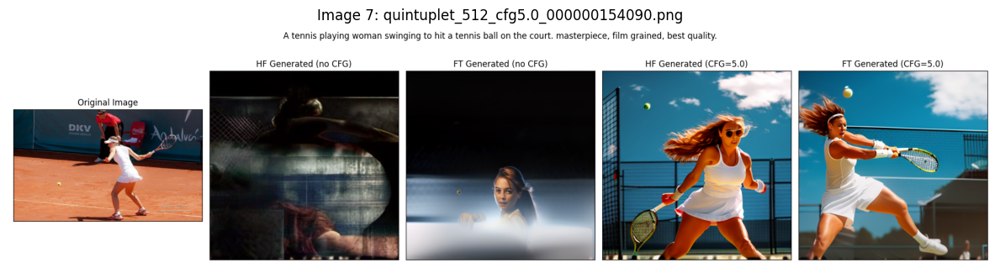

Displayed quintuplet_512_cfg5.0_000000154090.png (7/25)

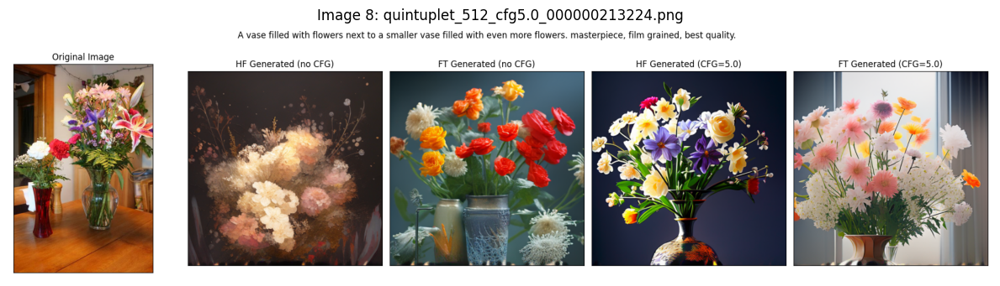

Displayed quintuplet_512_cfg5.0_000000213224.png (8/25)

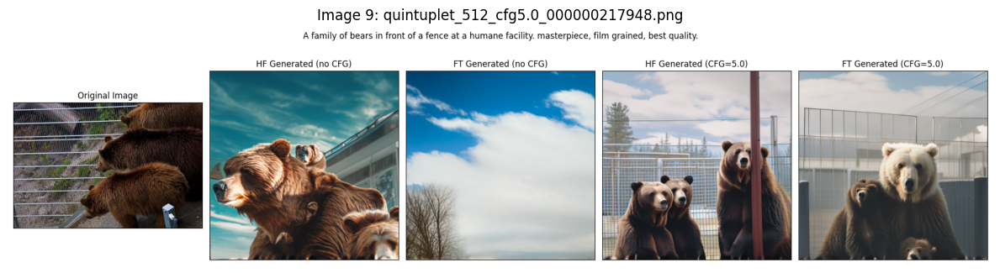

Displayed quintuplet_512_cfg5.0_000000217948.png (9/25)

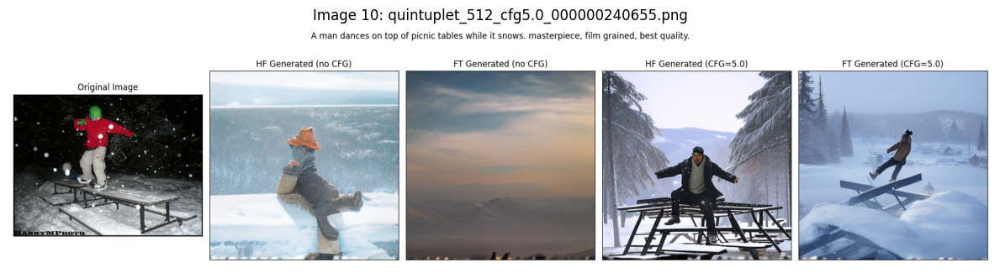

Displayed quintuplet_512_cfg5.0_000000240655.png (10/25)

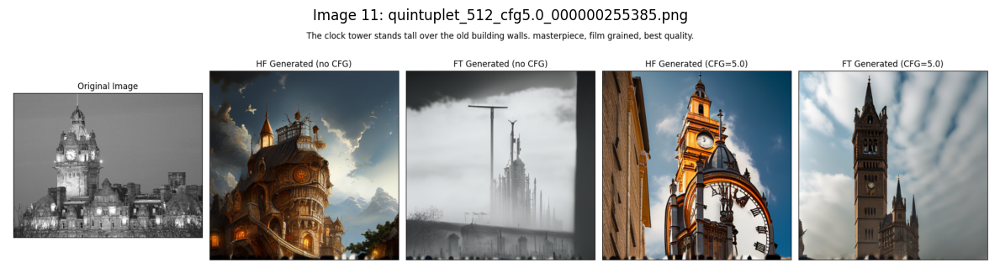

Displayed quintuplet_512_cfg5.0_000000255385.png (11/25)

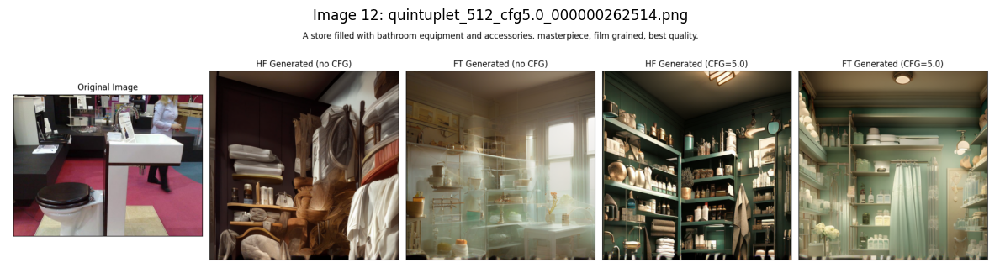

Displayed quintuplet_512_cfg5.0_000000262514.png (12/25)

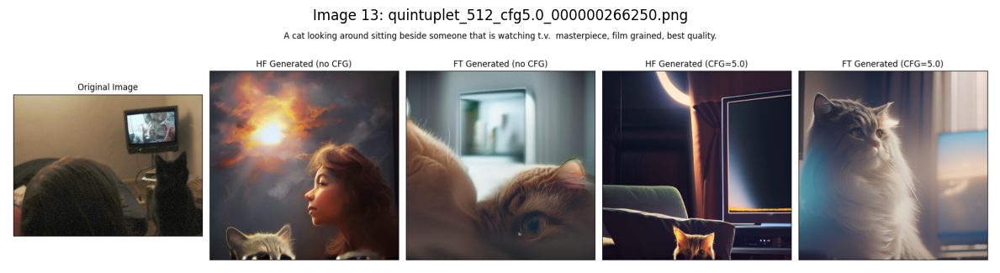

Displayed quintuplet_512_cfg5.0_000000266250.png (13/25)

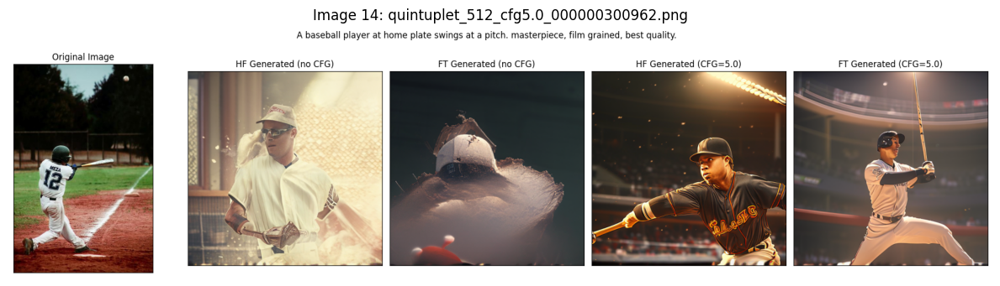

Displayed quintuplet_512_cfg5.0_000000300962.png (14/25)

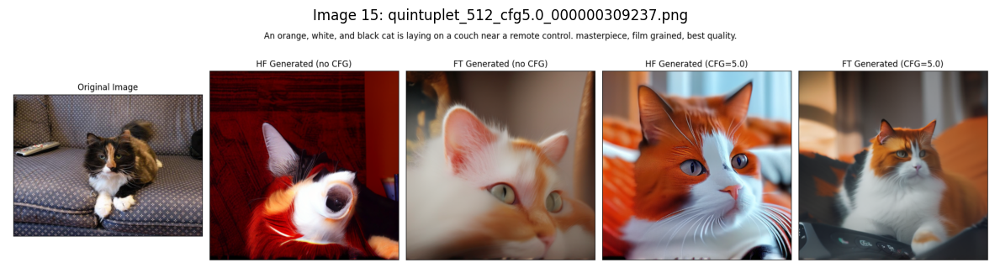

Displayed quintuplet_512_cfg5.0_000000309237.png (15/25)

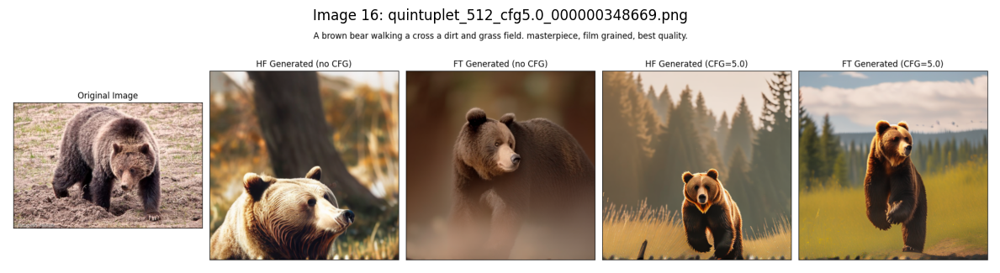

Displayed quintuplet_512_cfg5.0_000000348669.png (16/25)

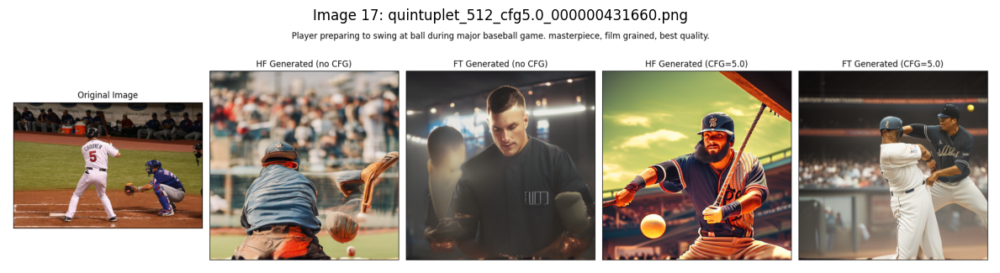

Displayed quintuplet_512_cfg5.0_000000431660.png (17/25)

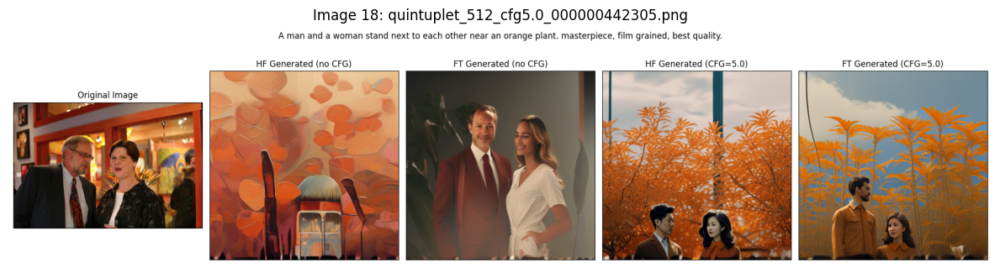

Displayed quintuplet_512_cfg5.0_000000442305.png (18/25)

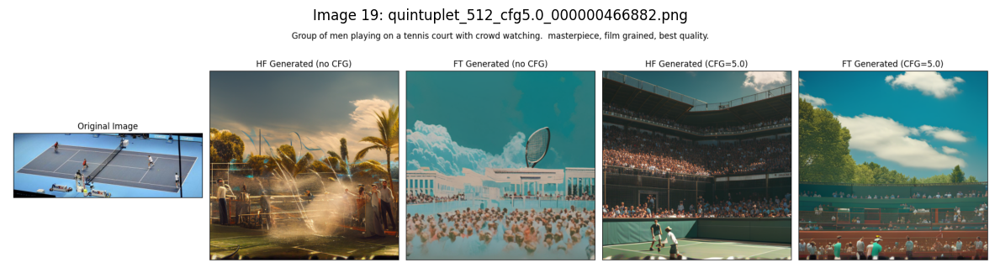

Displayed quintuplet_512_cfg5.0_000000466882.png (19/25)

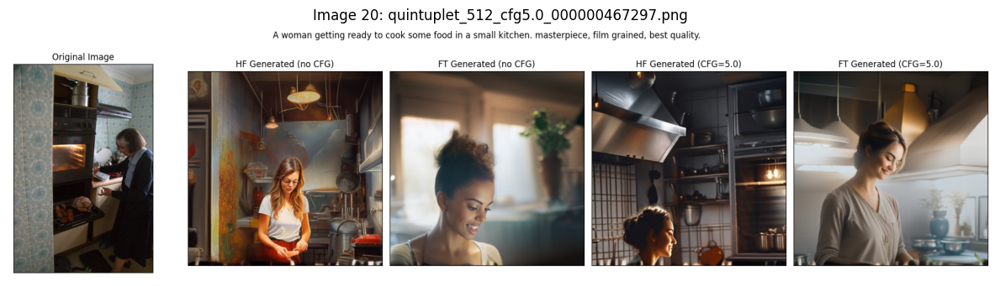

Displayed quintuplet_512_cfg5.0_000000467297.png (20/25)

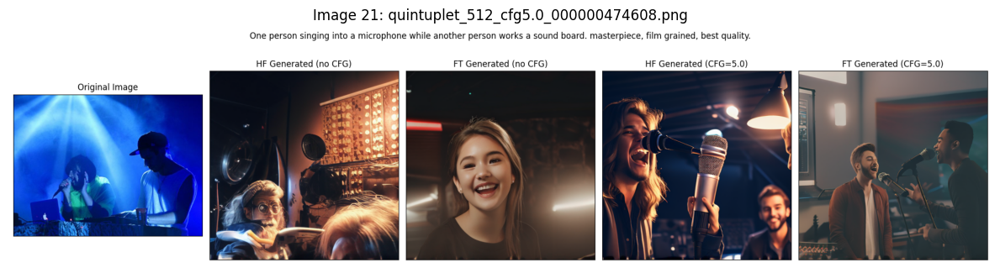

Displayed quintuplet_512_cfg5.0_000000474608.png (21/25)

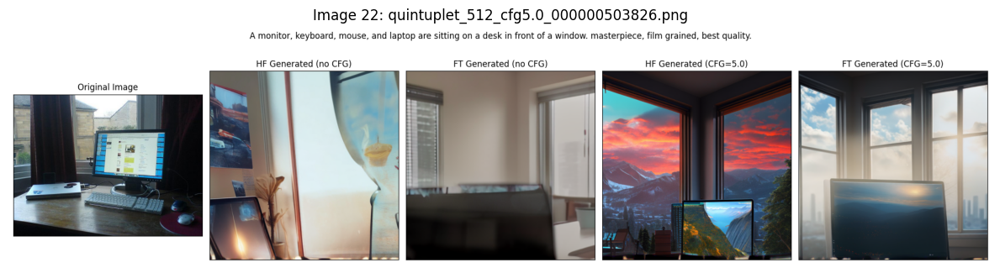

Displayed quintuplet_512_cfg5.0_000000503826.png (22/25)

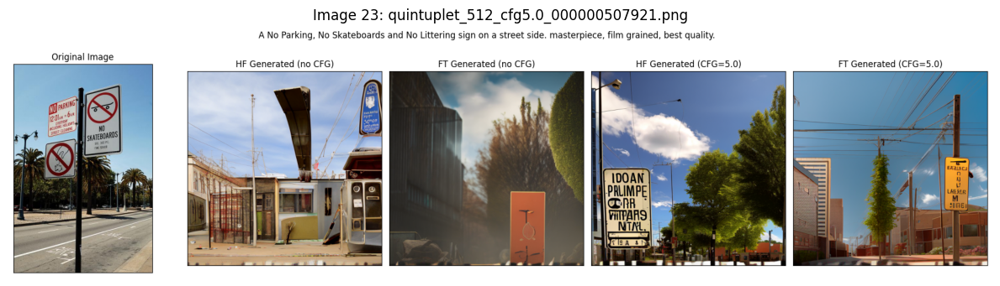

Displayed quintuplet_512_cfg5.0_000000507921.png (23/25)

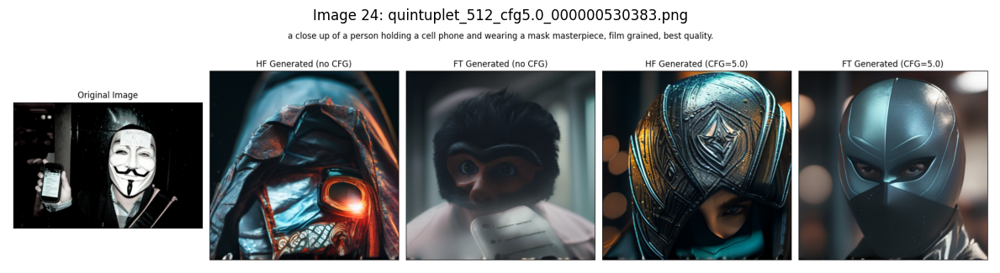

Displayed quintuplet_512_cfg5.0_000000530383.png (24/25)

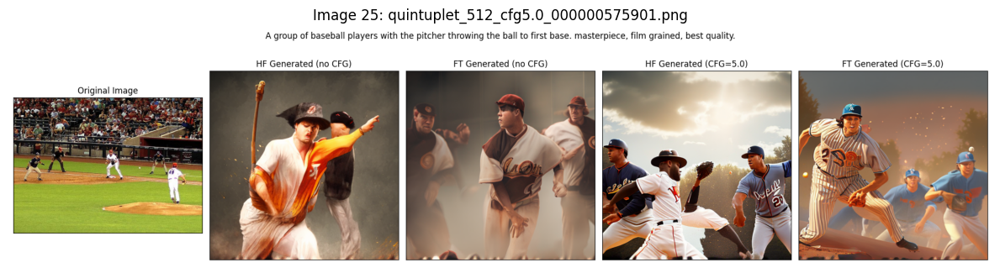

Displayed quintuplet_512_cfg5.0_000000575901.png (25/25)

In [6]:
current_dir = Path(os.getcwd())
plots_dir = current_dir.parent / "plots"

# Call the function to load and display images
plot_images_from_directory(
    plots_dir,
    prefix=f"quintuplet_{image_size}_cfg{guidance_scale:.1f}",  # Image size
)

## FID Curve 

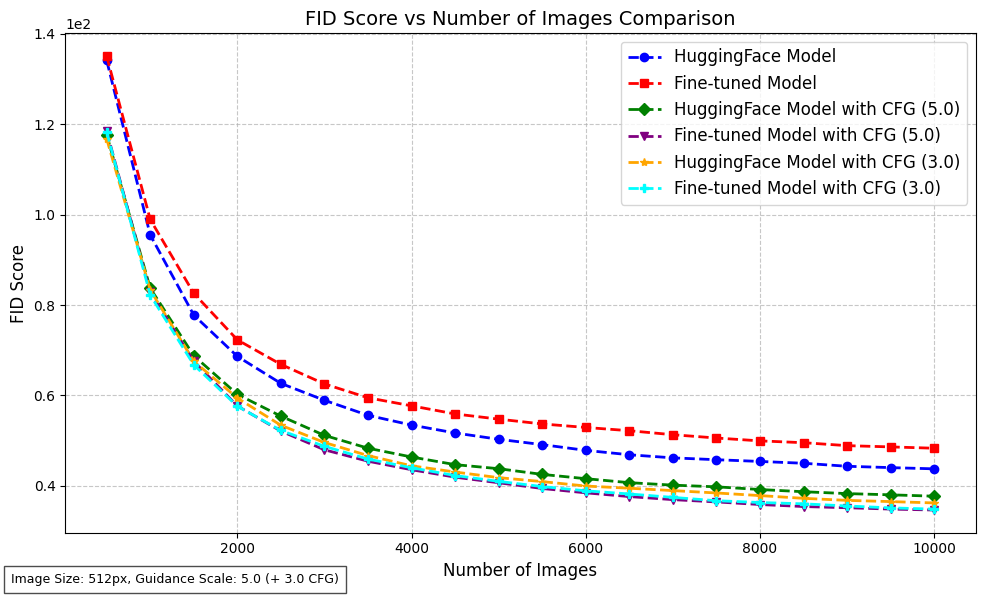

In [35]:
# Get directory paths
current_dir = Path(os.getcwd())
results_dir = current_dir.parent / "results"


def plot_fid_data(plt, fid_data, label, marker, color):
    """
    Plot FID (Fréchet Inception Distance) scores against number of images.

    Parameters:
        plt: matplotlib pyplot object
        fid_data (DataFrame): DataFrame containing 'Number of Images' and 'FID Score' columns
        label (str): Label for the plot legend
        marker (str): Marker style for data points
        color (str): Color for the plot line
    """
    plt.plot(
        fid_data["Number of Images"],
        fid_data["FID Score"],
        marker=marker,
        label=label,
        color=color,
        linestyle="--",
        linewidth=2,
    )


# Configuration variables
basename = "fid_scores_data"
markers = ["o", "s", "D", "v"]  # Different markers for each model
colors = ["blue", "red", "green", "purple"]  # Different colors for each model
models = {"hf": "HuggingFace Model", "ft": "Fine-tuned Model"}

# Create paths dictionary to store file paths for each model
paths = {}

# Generate file paths for standard and CFG (Classifier Free Guidance) models
for model, label in models.items():
    # Standard model path
    paths[model] = results_dir / f"{basename}_{model}_{image_size}.csv"

    # Add CFG model path if guidance scale is specified
    if guidance_scale is not None:
        cfg_path = (
            results_dir / f"{basename}_{model}_{image_size}_cfg{guidance_scale:.1f}.csv"
        )
        if os.path.exists(cfg_path):
            paths[f"{model}_cfg_{guidance_scale}"] = cfg_path

# Update model labels for CFG variants
for key, path in paths.items():
    if "cfg" in key:
        base_model = key.split("_")[0]  # Extract base model name (hf or ft)
        models[key] = f"{models[base_model]} with CFG ({guidance_scale:.1f})"

# Read data from CSV files into DataFrames
fid_data = {}
for model in models.keys():
    fid_data[model] = pd.read_csv(paths[model])

# For comparison add the data with guidance scale scale 3 in addition to 5
try:
    paths["hf_cfg_3"] = results_dir / f"{basename}_hf_{image_size}_cfg3.0.csv"
    fid_data["hf_cfg_3"] = pd.read_csv(paths["hf_cfg_3"])
    models["hf_cfg_3"] = "HuggingFace Model with CFG (3.0)"
    colors.append("orange")
    markers.append("*")

    paths["ft_cfg_3"] = results_dir / f"{basename}_ft_{image_size}_cfg3.0.csv"
    fid_data["ft_cfg_3"] = pd.read_csv(paths["ft_cfg_3"])
    models["ft_cfg_3"] = "Fine-tuned Model with CFG (3.0)"
    colors.append("cyan")
    markers.append("P")
    
except FileNotFoundError:
    print("No CFG (3.0) data found for HuggingFace or Fine-tuned models.")

# Create the FID comparison plot with scientific aesthetics
plt.figure(figsize=(10, 6))

# Plot data for each model
for i, (model, label) in enumerate(models.items()):
    plot_fid_data(
        plt,
        fid_data[model],
        label=label,
        marker=markers[i],
        color=colors[i],
    )

# Enhance plot with formatting and labels
# Add grid for better readability
plt.grid(True, linestyle="--", alpha=0.7)

# Add descriptive labels and title
plt.xlabel("Number of Images", fontsize=12)
plt.ylabel("FID Score", fontsize=12)  # Lower FID scores indicate better image quality
plt.title("FID Score vs Number of Images Comparison", fontsize=14)

# Add legend with appropriate size
plt.legend(fontsize=12)

# Format axes for scientific notation on y-axis
plt.tight_layout()
plt.ticklabel_format(style="sci", axis="y", scilimits=(0, 0))

# Add contextual information text
plt.figtext(
    0.02,
    0.02,
    f"Image Size: {image_size}px"
    + (f", Guidance Scale: {guidance_scale:.1f}" if guidance_scale is not None else "")
    + " (+ 3.0 CFG)" if "ft_cfg_3" in models.keys() else "",
    ha="left",
    fontsize=9,
    bbox={"facecolor": "white", "alpha": 0.7, "pad": 5},
)

# Display the plot in the notebook
plt.show()

> <font color="red">**Obs: Using CFG the fine tuned model performs better than the original hugging face model for image generation.**</font>

It might be the case that fine tuning the original model, that only generates images with captions, for visual question answering, might have improved the model for image generation. The representations might be getting enriched with more information.

Fine tuning is all you need? 😅

## FID Curve Model

In [36]:
def fit_fid_data(x, y, x_pred, x_fit, additive_baseline_power_law=False):
    """
    Fit a power law model to FID score data and generate predictions.

    Args:
        x: Array of number of images (independent variable)
        y: Array of FID scores (dependent variable, lower is better)
        x_pred: Points at which to make predictions
        x_fit: Points for generating the continuous fitted curve
        additive_baseline_power_law: If True, uses model with baseline term (a*x^(-k) + b)
                                    If False, uses simple power law (a*x^(-k))

    Returns:
        y_pred: Predicted FID scores at x_pred points
        y_fit: Fitted values for plotting the curve
        label: LaTeX formatted equation for the legend
    """
    if additive_baseline_power_law:
        # Power law with constant baseline: FID = a*x^(-k) + b
        def model(x, a, k, b):
            return a * x ** (-k) + b
    else:
        # Simple power law: FID = a*x^(-k)
        def model(x, a, k):
            return a * x ** (-k)

    # Fit curve to data using scipy's curve_fit
    try:
        params, _ = curve_fit(model, x, y, 
                              p0=([max(y), 1.0, 1.0] if additive_baseline_power_law else [max(y), 1.0]), 
                              maxfev=10000)
        y_pred = model(x_pred, *params)
        y_fit = model(x_fit, *params)

        # Create formatted equation string for plot legend
        label = (
            f"Fit: $f(x) = {params[0]:.2f} \\cdot x^{{-{params[1]:.2f}}} + {params[2]:.2f}$"
            if additive_baseline_power_law
            else f"Fit: $f(x) = {params[0]:.2f} \\cdot x^{{-{params[1]:.2f}}}$"
        )
        print(f"Predictions at {x_pred}: {np.round(y_pred, 2)}")
        return y_pred, y_fit, label
    except RuntimeError as e:
        print(f"Error fitting curve: {e}")
        return None, None, "Fit failed"


def plot_fid_data_and_fit_curve(
    plt, fid_data, model_label, marker, color, additive_baseline_power_law=False
):
    """
    Plot FID data points and fit a power law curve to visualize the trend.

    Args:
        plt: Matplotlib pyplot object
        fid_data: DataFrame with 'Number of Images' and 'FID Score' columns
        model_label: Label for the data points in the legend
        marker: Style of markers for data points
        color: Color for both data points and fitted curve
        additive_baseline_power_law: Whether to include baseline term in model
    """
    print(f"Processing {model_label} data...")

    # Extract data from DataFrame
    x = fid_data["Number of Images"]
    y = fid_data["FID Score"]
    min_x = min(x)
    max_x = max(x)

    # Generate points for smooth curve and extrapolated predictions
    x_fit = np.linspace(min_x, max_x, 500)  # Points for drawing continuous curve
    x_pred = np.array([10000, 15000, 20000, 25000, 30000])  # Points for extrapolation

    # Fit model and get predictions
    y_pred, y_fit, fit_label = fit_fid_data(
        x, y, x_pred, x_fit, additive_baseline_power_law
    )

    # Plot original data points
    plt.scatter(
        x,
        y,
        color=color,
        label=model_label,
        marker=marker,
        edgecolor="black",
    )

    # Plot fitted curve
    plt.plot(
        x_fit,
        y_fit,
        label=fit_label,
        color=color,
    )

    # Plot prediction points
    plt.scatter(x_pred, y_pred, color=color, marker="x", label="Predictions")

### Hugging Face and Fine Tuned Models with and without CFG

#### Power Law Fit of FID Scores

Processing HuggingFace Model data...

Predictions at [10000 15000 20000 25000 30000]: [38.86 33.09 29.53 27.03 25.15]

Processing Fine-tuned Model data...

Predictions at [10000 15000 20000 25000 30000]: [43.47 37.55 33.85 31.23 29.25]

Processing HuggingFace Model with CFG (5.0) data...

Predictions at [10000 15000 20000 25000 30000]: [33.63 28.57 25.45 23.26 21.62]

Processing Fine-tuned Model with CFG (5.0) data...

Predictions at [10000 15000 20000 25000 30000]: [30.44 25.47 22.44 20.34 18.78]

Processing HuggingFace Model with CFG (3.0) data...

Predictions at [10000 15000 20000 25000 30000]: [32.15 27.16 24.09 21.96 20.35]

Processing Fine-tuned Model with CFG (3.0) data...

Predictions at [10000 15000 20000 25000 30000]: [30.83 25.86 22.83 20.73 19.15]

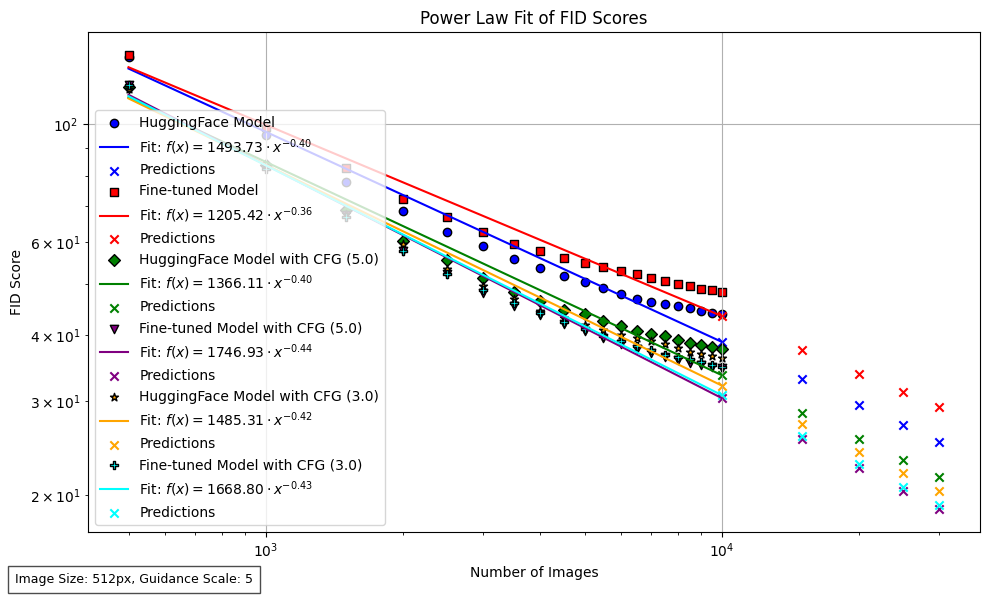

In [37]:
# Plot
plt.figure(figsize=(10, 6))
for i, (model, model_label) in enumerate(models.items()):
    plot_fid_data_and_fit_curve(
        plt=plt,
        fid_data=fid_data[model],
        model_label=model_label,
        marker=markers[i],
        color=colors[i],
        additive_baseline_power_law=False,
    )

# Add contextual information text
plt.figtext(
    0.02,
    0.02,
    f"Image Size: {image_size}px"
    + (f", Guidance Scale: {guidance_scale}" if guidance_scale is not None else ""),
    ha="left",
    fontsize=9,
    bbox={"facecolor": "white", "alpha": 0.7, "pad": 5},
)

plt.xlabel("Number of Images")
plt.ylabel("FID Score")
plt.xscale("log")
plt.yscale("log")
plt.title("Power Law Fit of FID Scores")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

#### Power Law Fit of FID Scores with Baseline

Processing HuggingFace Model data...

Predictions at [10000 15000 20000 25000 30000]: [43.06 40.13 38.52 37.49 36.77]

Processing Fine-tuned Model data...

Predictions at [10000 15000 20000 25000 30000]: [47.72 44.8  43.2  42.16 41.43]

Processing HuggingFace Model with CFG (5.0) data...

Predictions at [10000 15000 20000 25000 30000]: [37.09 34.38 32.88 31.91 31.23]

Processing Fine-tuned Model with CFG (5.0) data...

Predictions at [10000 15000 20000 25000 30000]: [33.81 31.02 29.49 28.51 27.81]

Processing HuggingFace Model with CFG (3.0) data...

Predictions at [10000 15000 20000 25000 30000]: [35.53 32.79 31.28 30.31 29.62]

Processing Fine-tuned Model with CFG (3.0) data...

Predictions at [10000 15000 20000 25000 30000]: [34.36 31.68 30.22 29.28 28.62]

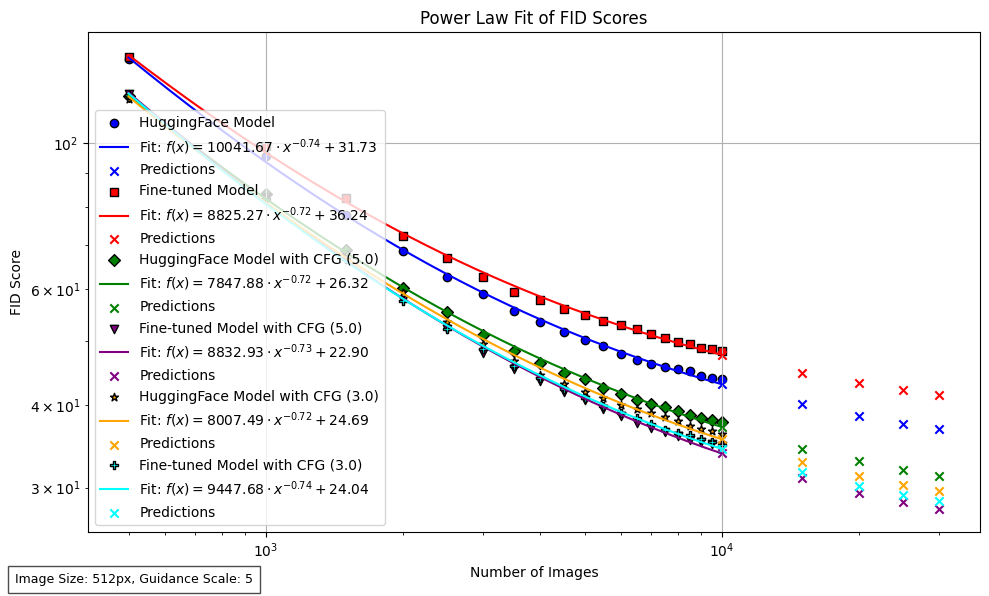

In [38]:
# Plot
plt.figure(figsize=(10, 6))
for i, (model, model_label) in enumerate(models.items()):
    plot_fid_data_and_fit_curve(
        plt=plt,
        fid_data=fid_data[model],
        model_label=model_label,
        marker=markers[i],
        color=colors[i],
        additive_baseline_power_law=True,
    )

# Add contextual information text
plt.figtext(
    0.02,
    0.02,
    f"Image Size: {image_size}px"
    + (f", Guidance Scale: {guidance_scale}" if guidance_scale is not None else ""),
    ha="left",
    fontsize=9,
    bbox={"facecolor": "white", "alpha": 0.7, "pad": 5},
)

plt.xlabel("Number of Images")
plt.ylabel("FID Score")
plt.xscale("log")
plt.yscale("log")
plt.title("Power Law Fit of FID Scores")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

### Curve Similarity Metrics

In [29]:
def L2_distance(reference, comparison):
    return np.sqrt(np.sum((reference - comparison) ** 2))


def mean_absolute_percentage_error(reference, comparison):
    return np.mean(np.abs((reference - comparison) / reference))

In [41]:
l2_distance_fid_cfg = L2_distance(
    fid_data["hf_cfg_3"]["FID Score"], fid_data["ft_cfg_3"]["FID Score"]
)

mape_fid_cfg = mean_absolute_percentage_error(
    fid_data["hf_cfg_3"]["FID Score"], fid_data["ft_cfg_3"]["FID Score"]
)

print(f"L2 distance: {l2_distance_fid_cfg:.2f}")
print(f"MAPE: {mape_fid_cfg:.2f}")

L2 distance: 5.48

MAPE: 0.03

In [42]:
l2_distance_fid_cfg = L2_distance(
    fid_data["hf_cfg_5"]["FID Score"], fid_data["ft_cfg_5"]["FID Score"]
)

mape_fid_cfg = mean_absolute_percentage_error(
    fid_data["hf_cfg_5"]["FID Score"], fid_data["ft_cfg_5"]["FID Score"]
)

print(f"L2 distance: {l2_distance_fid_cfg:.2f}")
print(f"MAPE: {mape_fid_cfg:.2f}")

L2 distance: 12.86

MAPE: 0.06